In [ ]:
# Set the plot size
options(repr.plot.width=10, repr.plot.height=7)

In [56]:
# Import the dataset
data_all = read.csv('merged_subsample_sentiment.csv', header = TRUE)
# Select useful attributes
data_sub = subset(data_all, select=c('day','month','year','fu_followers','fu_following','fu_favorites',
                                   'fu_tweets','source','tweet_len','hashtag_len','relative_pos','sentiment'))
data_sub = na.omit(data_sub)  # remove rows with missing values
head(data_sub)

,day,month,year,fu_followers,fu_following,fu_favorites,fu_tweets,source,tweet_len,hashtag_len,relative_pos,sentiment
1,26,5,2015,601,629,1612,6950,Twitter Web Client,126,6,0.8916667,0
2,24,5,2015,133012,416,1105,2530,aknnfcghd,136,4,0.7121212,0
3,26,2,2016,176,3,55,315887,twitterfeed,106,10,0,-0.765
4,16,7,2015,210,86,0,506947,dlvr.it,98,12,0.8255814,0.5859
5,15,6,2015,552,570,669,2851,Twitter for iPhone,128,4,0.2580645,0
6,17,2,2016,147,84,1,1283,NomadLikes,140,6,0.8955224,0.5859


In [3]:
# summary of the data set
# The dataset contains both categorical and continuous variables

summary(data_sub)

      day           month             year       fu_followers    
 17     : 552   Min.   : 1.000   Min.   :2015   Min.   :      0  
 16     : 476   1st Qu.: 5.000   1st Qu.:2015   1st Qu.:    107  
 15     : 434   Median : 8.000   Median :2015   Median :    403  
 29     : 403   Mean   : 7.564   Mean   :2015   Mean   :   5874  
 22     : 401   3rd Qu.:10.000   3rd Qu.:2015   3rd Qu.:   1429  
 1      : 388   Max.   :12.000   Max.   :2016   Max.   :4050886  
 (Other):7947                                                    
  fu_following     fu_favorites      fu_tweets      
 Min.   :     0   Min.   :     0   Min.   :      1  
 1st Qu.:    63   1st Qu.:     5   1st Qu.:   1602  
 Median :   281   Median :   175   Median :   8890  
 Mean   :  1386   Mean   :  3333   Mean   :  48503  
 3rd Qu.:   968   3rd Qu.:  1522   3rd Qu.:  40234  
 Max.   :695722   Max.   :485197   Max.   :2484338  
                                                    
                                                

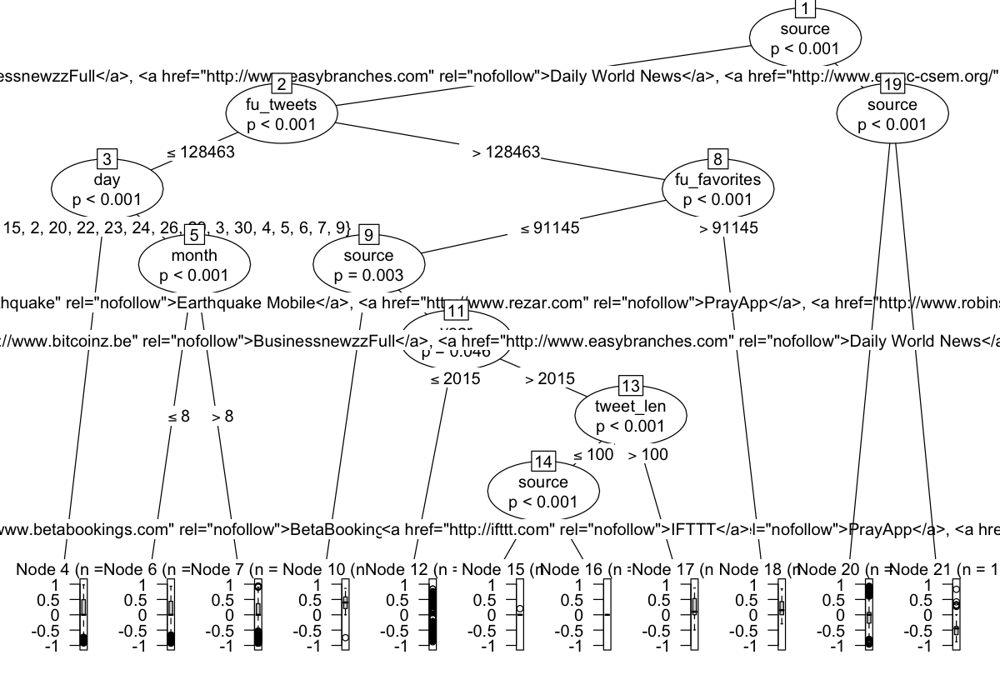

In [4]:
# Decision Tree

# Make sure 'party' library has been installed and loaded

library(party)

ct = ctree(sentiment ~. , data=data_sub)
plot(ct)

In [5]:
# It's messy. Remove "source" and "day" from the tree

data_sub2 = subset(data_sub,select=-c(source,day))
head(data_sub2)

,month,year,fu_followers,fu_following,fu_favorites,fu_tweets,tweet_len,hashtag_len,relative_pos,sentiment
1,5,2015,601,629,1612,6950,126,6,0.8916667,0
2,5,2015,133012,416,1105,2530,136,4,0.7121212,0
3,2,2016,176,3,55,315887,106,10,0,-0.765
4,7,2015,210,86,0,506947,98,12,0.8255814,0.5859
5,6,2015,552,570,669,2851,128,4,0.2580645,0
6,2,2016,147,84,1,1283,140,6,0.8955224,0.5859


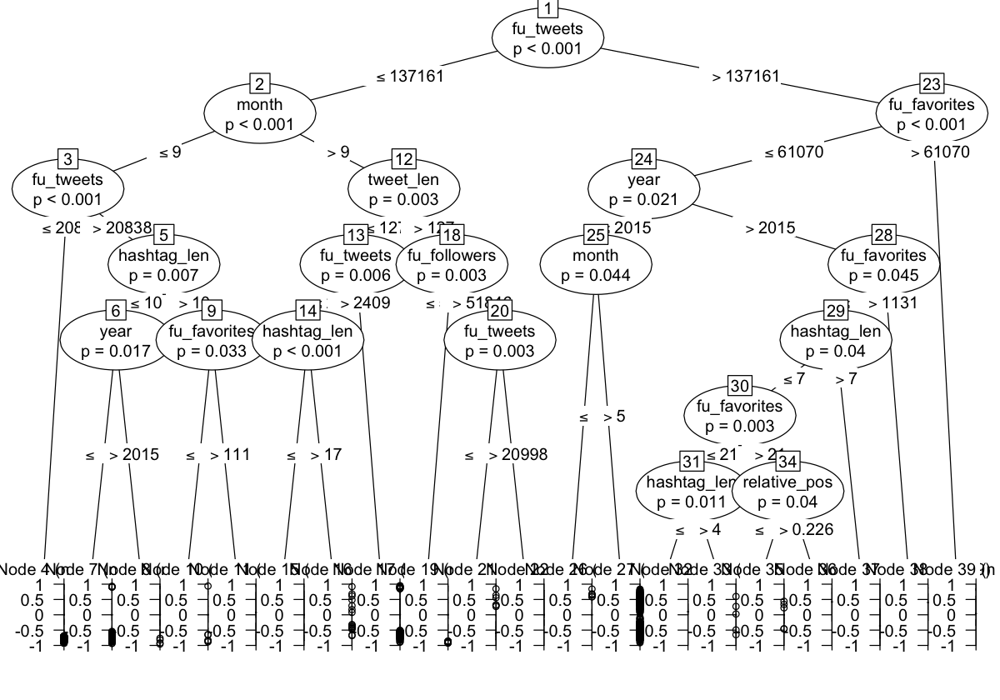

In [6]:
ct2 = ctree(sentiment ~. , data=data_sub2)
plot(ct2)

In [7]:
# It's still messy. Remove "tweet_len" and "hashtag_len"

data_sub3 = subset(data_sub2,select=-c(tweet_len,hashtag_len))
head(data_sub3)

,month,year,fu_followers,fu_following,fu_favorites,fu_tweets,relative_pos,sentiment
1,5,2015,601,629,1612,6950,0.8916667,0
2,5,2015,133012,416,1105,2530,0.7121212,0
3,2,2016,176,3,55,315887,0,-0.765
4,7,2015,210,86,0,506947,0.8255814,0.5859
5,6,2015,552,570,669,2851,0.2580645,0
6,2,2016,147,84,1,1283,0.8955224,0.5859


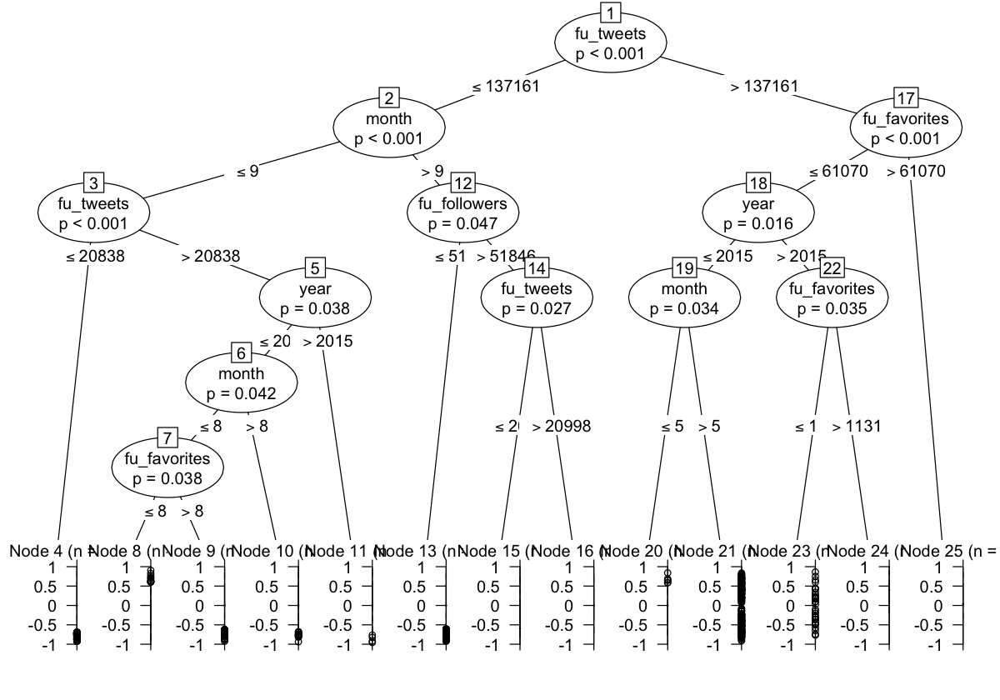

In [8]:
ct3 = ctree(sentiment ~. , data=data_sub3)
plot(ct3)

In [95]:
# linear regression

# sentiment score is used as response variable and other continuous numerical variables are used as predictors

# remove categorial variables

data_sub = subset(data_all, select=c('day','month','year','fu_followers','fu_following','fu_favorites',
                                   'fu_tweets','source','tweet_len','hashtag_len','relative_pos','sentiment'))
data_sub4 = subset(data_sub,select=-c(source,day,month,year,source))
head(data_sub4)

,fu_followers,fu_following,fu_favorites,fu_tweets,tweet_len,hashtag_len,relative_pos,sentiment
1,601,629,1612,6950,126,6,0.8916667,0
2,133012,416,1105,2530,136,4,0.7121212,0
3,176,3,55,315887,106,10,0,-0.765
4,210,86,0,506947,98,12,0.8255814,0.5859
5,552,570,669,2851,128,4,0.2580645,0
6,147,84,1,1283,140,6,0.8955224,0.5859


In [96]:
# regress on all predictors

lin_1 = lm(sentiment ~., data=data_sub4)
summary(lin_1)


Call:
lm(formula = sentiment ~ ., data = data_sub4)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.04307 -0.12089 -0.09766  0.30596  1.27450 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)   1.226e-01  1.806e-02   6.792 1.17e-11 ***
fu_followers -6.432e-08  5.467e-08  -1.177 0.239382    
fu_following  3.470e-07  4.085e-07   0.849 0.395666    
fu_favorites  9.809e-07  2.678e-07   3.663 0.000251 ***
fu_tweets    -3.348e-07  3.287e-08 -10.186  < 2e-16 ***
tweet_len    -1.775e-04  1.345e-04  -1.319 0.187090    
hashtag_len   1.620e-03  8.298e-04   1.952 0.050980 .  
relative_pos -3.329e-03  2.644e-03  -1.259 0.208096    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3909 on 10593 degrees of freedom
  (28 observations deleted due to missingness)
Multiple R-squared:  0.01121,	Adjusted R-squared:  0.01056 
F-statistic: 17.16 on 7 and 10593 DF,  p-value: < 2.2e-16


In [97]:
# fu_favorites and fu_tweets are significant at alpha = 0.05

# only keep these 2 variables in the model and regess again

lin_2 = lm(sentiment ~ fu_favorites + fu_tweets, data=data_sub4)
summary(lin_2)


Call:
lm(formula = sentiment ~ fu_favorites + fu_tweets, data = data_sub4)

Residuals:
    Min      1Q  Median      3Q     Max 
-1.0529 -0.1133 -0.1007  0.3072  1.2689 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)   1.127e-01  4.151e-03  27.143  < 2e-16 ***
fu_favorites  9.810e-07  2.650e-07   3.702 0.000215 ***
fu_tweets    -3.327e-07  3.212e-08 -10.361  < 2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3909 on 10598 degrees of freedom
  (28 observations deleted due to missingness)
Multiple R-squared:  0.01049,	Adjusted R-squared:  0.01031 
F-statistic:  56.2 on 2 and 10598 DF,  p-value: < 2.2e-16


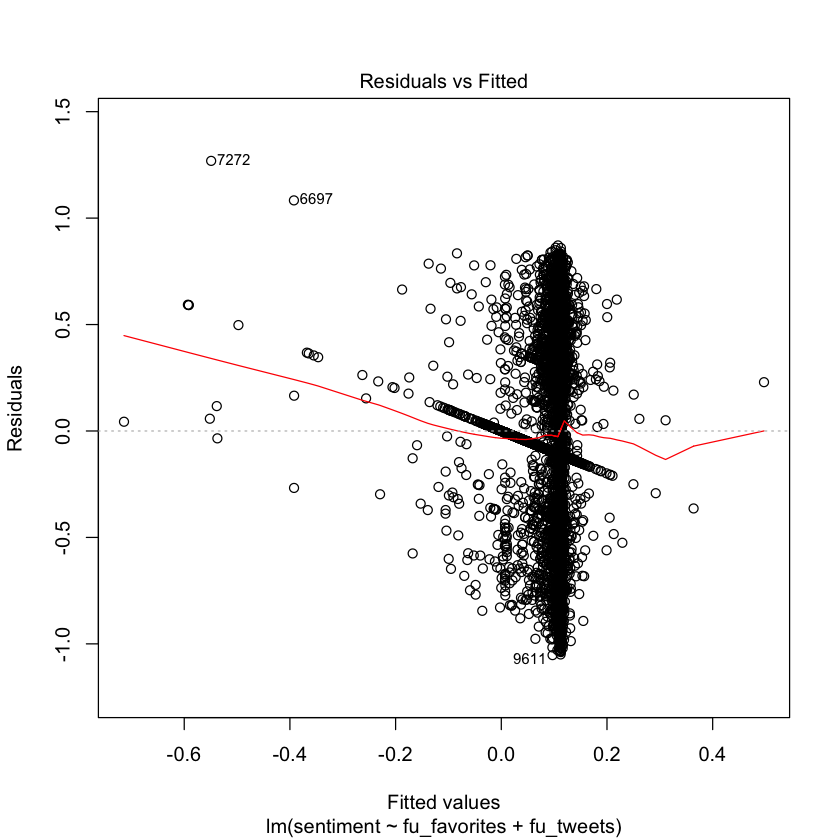

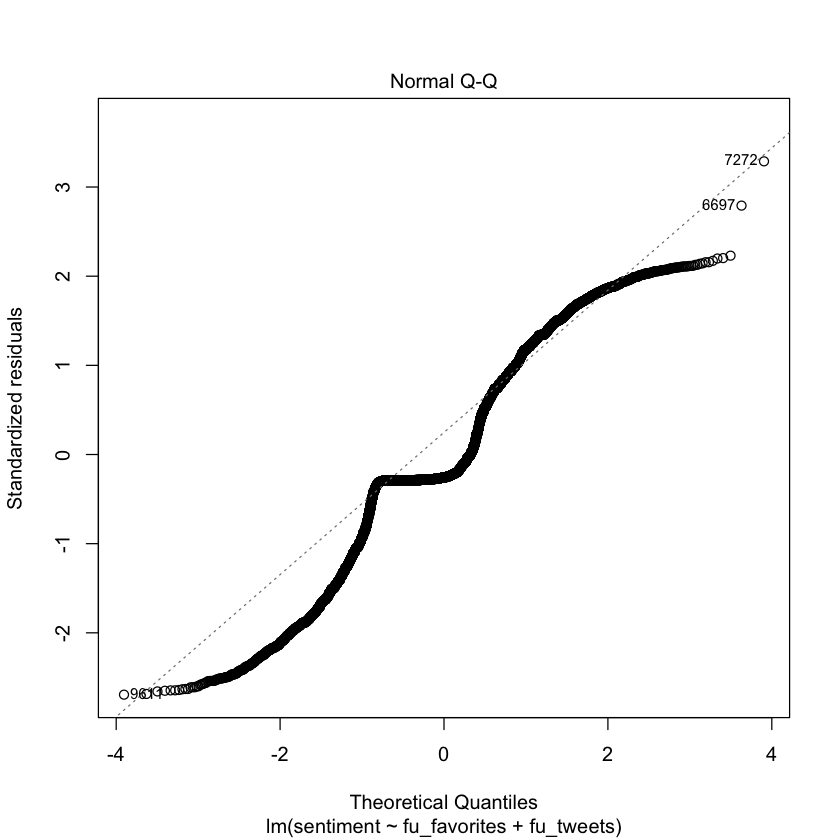

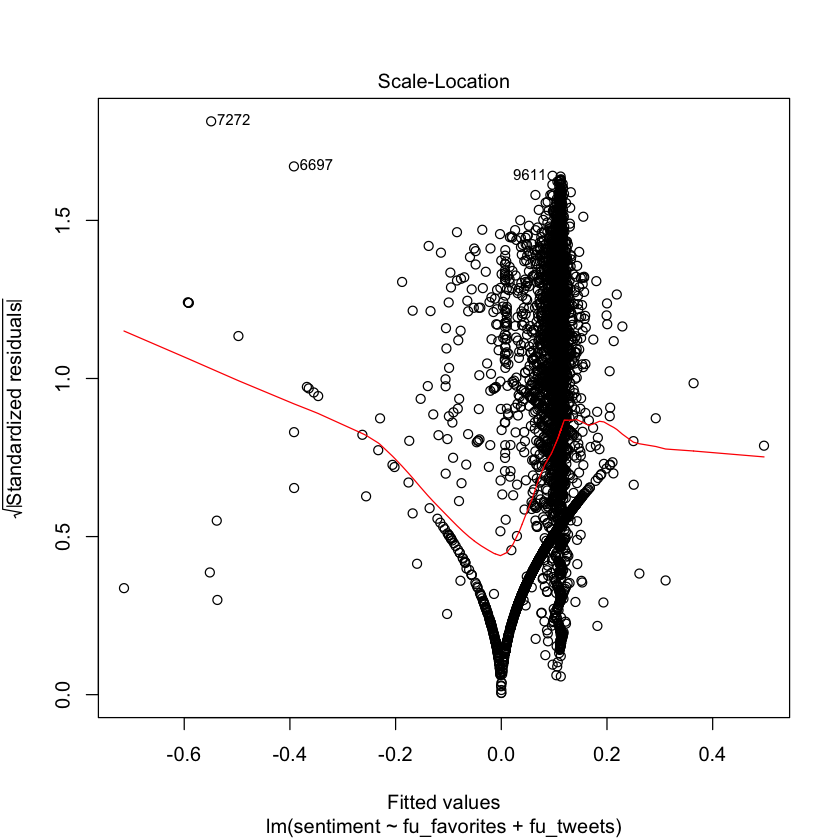

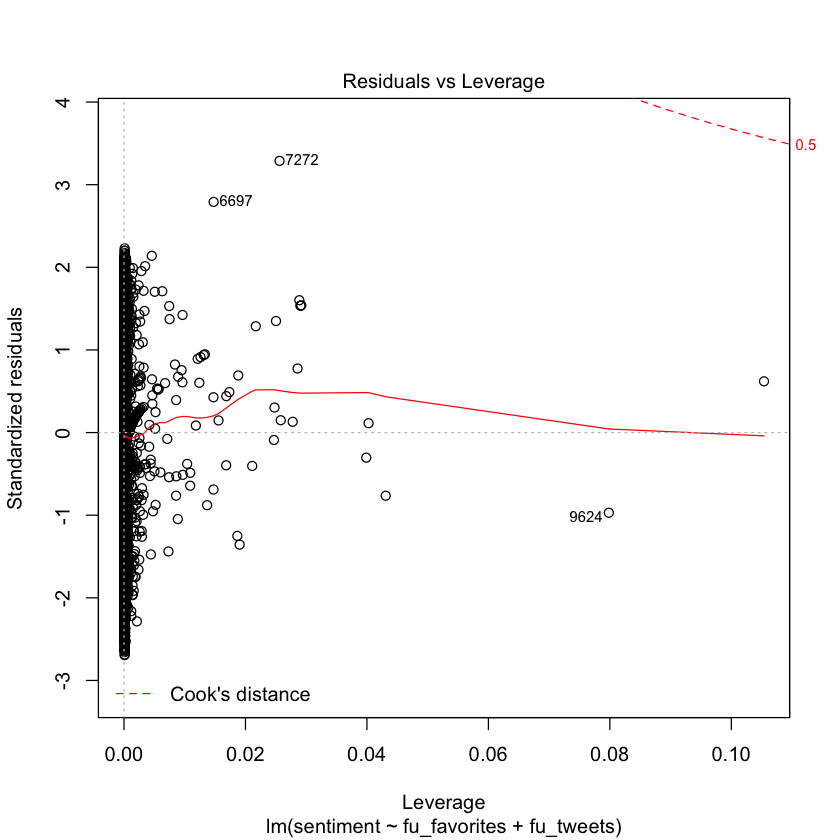

In [98]:
plot(lin_2)

In [57]:
# SVM

# SVM can work with both categorical and continuous dependent variables
# categorize the sentiment scores and save it to a new variable called "sentiment_label"

data_sub$sentiment_label = cut(data_sub$sentiment,c(-1,-0.6,-0.2,0.2,0.6,1),labels=c('SN','N','Neu','P','SP'))

In [59]:
# split the data set into training and testing data sets

library(caret)
set.seed(2)
data_sub = subset(data_sub,select=-c(8))  # remove source 
train_index = createDataPartition(y=data_sub$sentiment, p=0.7, list=FALSE)
train_set = data_sub[train_index,]
test_set = data_sub[-train_index,]

In [61]:
# prepare the data set

# categorical

train_set_cat = subset(train_set, select=-11)
test_set_cat = subset(test_set, select=-11)

# continuous 

train_set_con = subset(train_set, select=-12)
test_set_con = subset(test_set, select=-12)

In [93]:
# Train the model in categorical mode

library('e1071')

svm_cat_1 = svm(sentiment_label ~., data=train_set_cat)
summary(svm_cat_1)


Call:
svm(formula = sentiment_label ~ ., data = train_set_cat)


Parameters:
   SVM-Type:  C-classification 
 SVM-Kernel:  radial 
       cost:  1 
      gamma:  0.02222222 

Number of Support Vectors:  6521

 ( 2666 403 1585 901 966 )


Number of Classes:  5 

Levels: 
 SN N Neu P SP




In [69]:
# do prediction on test set

predict(svm_cat_1, subset(test_set_cat, select=-11))

4     7    10    14    15    19    24    28    29    30    31    32    40 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
   41    46    48    54    64    67    68    71    76    78    79    84    85 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
   86    87    88    90    92    96   100   101   106   108   109   110   112 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  114   116   117   119   121   124   125   135   136   139   144   145   157 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  159   161   164   167   169   172   174   178   181   188   189   192   193 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  194   196   197   203   206   212   213   216   217   223   225   227   229 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  234   236   238   251   257   259   262   263   266   270   271   272   275 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  278   283   285   292   293   295   297   303   309   315   316   317   318 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  320   323   327   328   329   332   336   338   339   347   350   355   356 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  359   365   369   374   375   378   381   382   388   390   392   395   403 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  404   405   409   412   413   417   426   427   429   432   435   437   442 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  447   449   459   461   464   466   467   468   469   474   477   478   480 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  481   483   484   488   491   496   497   507   511   512   519   520   522 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  523   534   535   537   540   543   548   549   568   576   577   579   586 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  588   589   590   601   607   609   616   617   619   622   626   629   630 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  638   640   641   644   645   649   658   659   660   664   665   668   671 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  674   675   680   681   686   687   688   689   690   694   699   702   705 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  709   715   721   724   727   731   737   740   742   744   745   747   751 
  Neu   Neu   Neu   Neu   Neu   Neu     N   Neu   Neu   Neu   Neu   Neu   Neu 
  754   756   757   758   760   762   763   764   768   771   773   780   781 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  782   788   791   792   793   794   796   799   805   813   819   823   826 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  827   828   846   847   848   850   851   852   854   858   864   865   868 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  869   872   873   877   881   884   885   886   888   889   893   898   899 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  900   907   909   911   916   919   924   927   933   935   936   944   948 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
  951   954   957   960   964   966   974   977   978   980   983   985   993 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
 1003  1005  1009  1010  1011  1017  1020  1022  1025  1028  1034  1035  1037 
  Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu   Neu 
 1041  1042  1044  1045  1050  1059  1063  1064  1066 

In [70]:
# Train the model in continuous mode

svm_con_1 = svm(sentiment ~., data=train_set_con)
summary(svm_con_1)


Call:
svm(formula = sentiment ~ ., data = train_set_con)


Parameters:
   SVM-Type:  eps-regression 
 SVM-Kernel:  radial 
       cost:  1 
      gamma:  0.02222222 
    epsilon:  0.1 


Number of Support Vectors:  5586






In [72]:
# do prediction on test set

pred = predict(svm_con_1, subset(test_set_con, select=-11))

In [79]:
# combine the predicted sentiment scores and true sentiment scores into one data frame

merged_df = data.frame(pred, test_set_con$sentiment)
names(merged_df) = c('Predicted_Sentiment', 'True_Sentiment')
rownames(merged_df) = NULL    # reset index
head(merged_df)

,Predicted_Sentiment,True_Sentiment
1,-0.06214108,0.5859
2,0.04438942,0.5859
3,0.1114856,0.6369
4,0.04324261,0.979
5,0.05408576,0
6,0.0195478,0


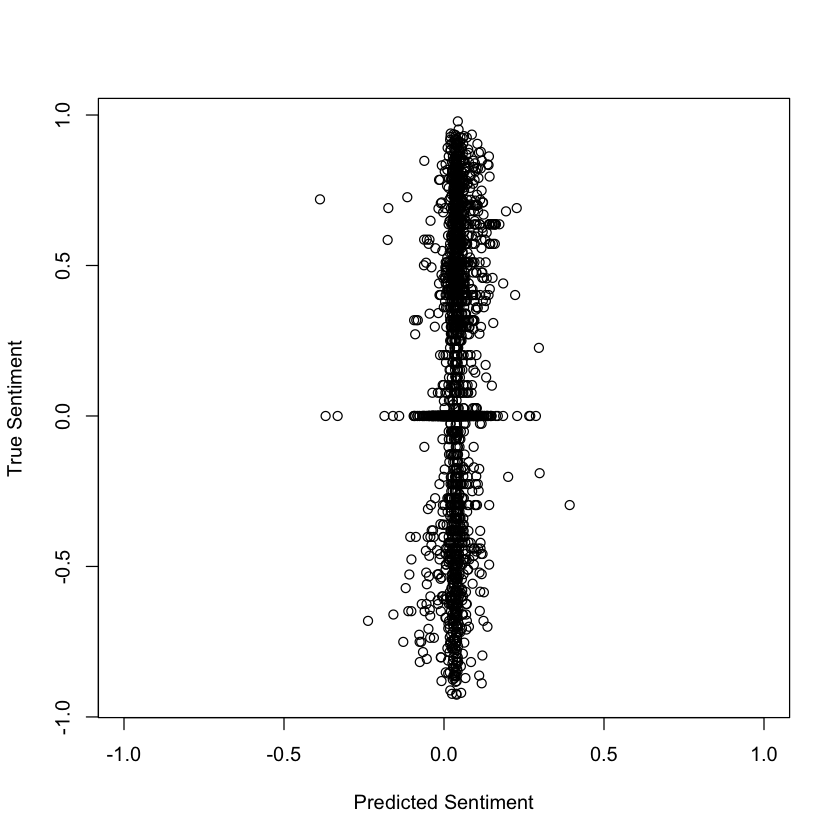

In [90]:
# plot the relationship between the predicted sentiment scores and true sentiment scores

options(repr.plot.width=7, repr.plot.height=7)

plot(merged_df$Predicted_Sentiment, merged_df$True_Sentiment, xlab='Predicted Sentiment', ylab='True Sentiment', xlim=c(-1,1))